In [1]:
import pandas as pd
import numpy as np
from datetime import datetime as dt
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import mpld3
import re
import math
from v_finite_polygons import voronoi_finite_polygons_2d
from scipy.spatial import Voronoi, voronoi_plot_2d
from matplotlib.patches import Polygon, Patch
import matplotlib.image as mpimg
from matplotlib.ticker import ScalarFormatter

In [2]:
InteriorSensors = {
    'S-01':[3.5,5],
    'S-02':[2,5],
    'S-03':[3.5,6.5],
    'S-04':[3.5,5.1],
    'S-05':[3.5,3.5],
    'S-06':[5,5],
    'S-07':[1,9.9],
    'S-08':[1,10],
    'S-09':[10-.1,10],
    'S-10':[10,10],
    'S-11':[10,1.1],
    'S-12':[10,1],
    'S-13':[1,1.1],
    'S-15':[1,1],
}

In [3]:
ZoneAssignments = pd.read_csv('./dataInfo/ZoneAssignments.csv')
key = list(ZoneAssignments.keys())[0]
numZones = len(set(ZoneAssignments[key]))
AutoZoneAssignments = pd.read_csv('./dataInfo/AutoZoneAssignments.csv')
key = list(AutoZoneAssignments.keys())[0]
numZones = len(set(AutoZoneAssignments[key]))
allFiles = glob.glob("./interpolatedData/*.csv")
avgData = glob.glob("./stretchedAvgData/*.csv")
avgDataAuto = glob.glob("./stretchedAvgDataAuto/*.csv")
expData = glob.glob("./stretchedExpirementData/*.csv")
expDataAuto = glob.glob("./stretchedExpirementDataAuto/*.csv")
df = {}
for x in allFiles:
    name = x.split('\\')[1].split('.')[0]
    df[name] = pd.read_csv(x,parse_dates=[0])
mergedData = pd.read_csv('./mergedData/mergedFrame.csv',parse_dates=[0])
stAvgDf = {}
for x in avgData:
    name = x.split('\\')[1].split('.')[0]
    stAvgDf[name] = pd.read_csv(x)
stAvgDfAuto = {}
for x in avgDataAuto:
    name = x.split('\\')[1].split('.')[0]
    stAvgDfAuto[name] = pd.read_csv(x)
stExpDf = {}
for x in expData:
    name = x.split('\\')[1].split('.')[0]
    stExpDf[name] = pd.read_csv(x)
stExpDfAuto = {}
for x in expDataAuto:
    name = x.split('\\')[1].split('.')[0]
    stExpDfAuto[name] = pd.read_csv(x)

Text(0.5, 1.0, 'Variance in Particles')

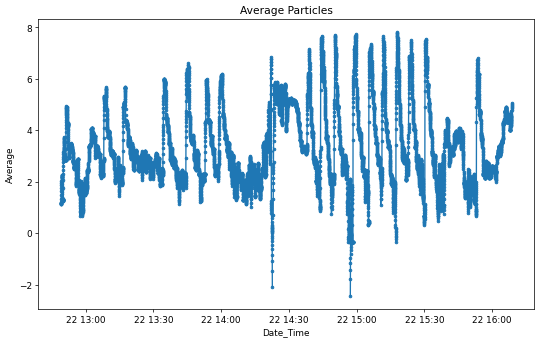

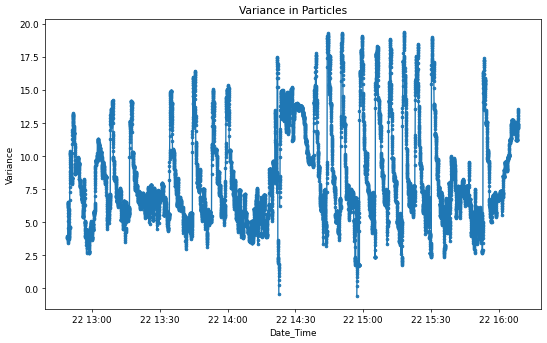

In [4]:
split = len(mergedData)

fig = plt.figure(0, figsize=(10,6), dpi=64)
ax = fig.gca()
ax.plot(mergedData['Date_Time'][:split],np.log(mergedData['Average'][:split])/np.log(3),'.-')
ax.set_xlabel(mergedData.columns[0])
ax.set_ylabel('Average')
plt.title('Average Particles')

fig = plt.figure(2, figsize=(10,6), dpi=64)
ax = fig.gca()
ax.plot(mergedData['Date_Time'][:split],np.log(mergedData['Variance'])[:split],'.-')
ax.set_xlabel(mergedData.columns[0])
ax.set_ylabel('Variance')
plt.title('Variance in Particles')

# fig = plt.figure(1, figsize=(10,6), dpi=64)
# ax = fig.gca()
# ax.plot(mergedData['Date_Time'][split:],np.log(mergedData['Average'][split:])/np.log(3),'.-')
# ax.set_xlabel(mergedData.columns[0])
# ax.set_ylabel('Average')
# plt.title('Average Particles')

# fig = plt.figure(4, figsize=(10,6), dpi=64)
# ax = fig.gca()
# ax.plot(mergedData['Date_Time'][split:],np.log(mergedData['Variance'])[split:],'.-')
# ax.set_xlabel(mergedData.columns[0])
# ax.set_ylabel('Variance')
# plt.title('Variance in Particles')

In [5]:
# These are the "Tableau 20" colors as RGB.    
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]    
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)

color = tableau20

### All Sensors Plotted

In [6]:
mergedData

,Date_Time,S-01,S-03,S-04,S-05,S-06,S-07,S-08,S-09,S-11,S-12,S-13,S-14,S-15,S-BU1,Average,Variance
0,2020-12-22 12:49:00,0.0,0.0,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,0.0,21.0,0.0,78.0,3.692308,51.443787
1,2020-12-22 12:49:01,0.0,0.9,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,0.9,18.9,0.0,78.0,3.669231,49.462722
2,2020-12-22 12:49:02,0.0,1.8,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,1.8,16.8,0.0,78.0,3.646154,47.481657
3,2020-12-22 12:49:03,0.0,2.7,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,2.7,14.7,0.0,78.0,3.623077,45.500592
4,2020-12-22 12:49:04,0.0,3.6,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,3.6,12.6,0.0,78.0,3.600000,43.519527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11976,2020-12-22 16:08:36,40.8,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,13.2,2730.0,5.4,9.0,7.8,215.953846,558622.885207
11977,2020-12-22 16:08:37,42.6,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,9.9,2866.5,6.3,9.0,9.1,226.407692,608792.900592
11978,2020-12-22 16:08:38,44.4,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,6.6,3003.0,7.2,9.0,10.4,236.861538,658962.915976
11979,2020-12-22 16:08:39,46.2,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,3.3,3139.5,8.1,9.0,11.7,247.315385,709132.931361


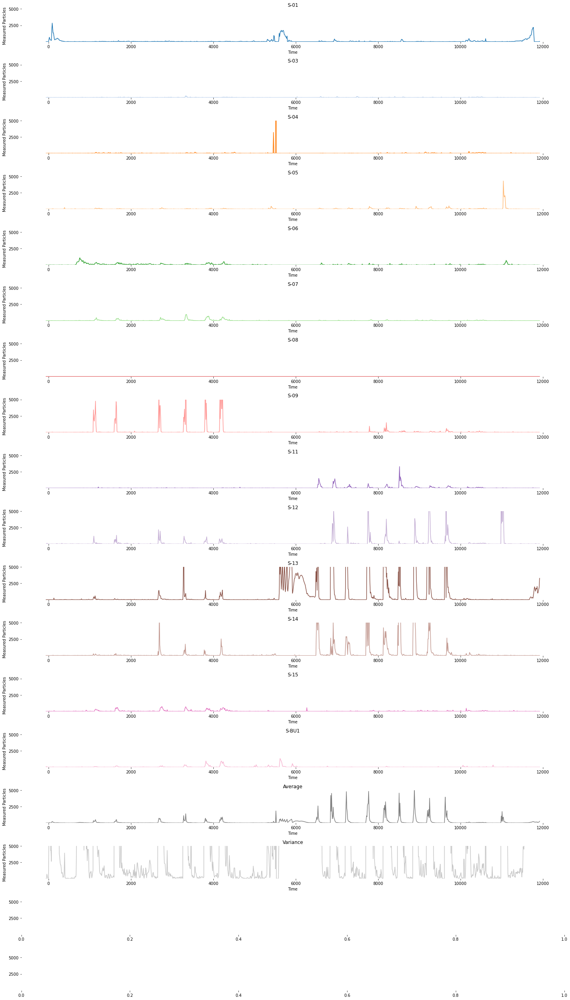

In [7]:

fig,sPlt=plt.subplots(18,sharex=False,sharey=False,figsize=(20,35))
# fig.delaxes(sPlt[1,1])
DataFrame = mergedData

for idx,sensor in enumerate(DataFrame.columns[1:19]):
    yData = (DataFrame[sensor])
    xData = [i for i in range(-60,len(yData)-60)]

    sPlt[idx].plot(xData,yData,color = color[idx],label = sensor)

    sPlt[idx].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[idx].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sPlt[idx].set(title=sensor,xlabel='Time',ylabel='Measured Particles')



for ax in sPlt:
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False) 
    # ax.legend(prop={'size':9})
    ax.set_ylim([1,5000])
    # ax.set_yscale("log")

    
    
plt.tight_layout()
plt.rcParams.update({'font.size':16})


### Zones Plotted Showing Sensor

In [8]:
InteriorSensors

{'S-01': [3.5, 5],
 'S-02': [2, 5],
 'S-03': [3.5, 6.5],
 'S-04': [3.5, 5.1],
 'S-05': [3.5, 3.5],
 'S-06': [5, 5],
 'S-07': [1, 9.9],
 'S-08': [1, 10],
 'S-09': [9.9, 10],
 'S-10': [10, 10],
 'S-11': [10, 1.1],
 'S-12': [10, 1],
 'S-13': [1, 1.1],
 'S-15': [1, 1]}

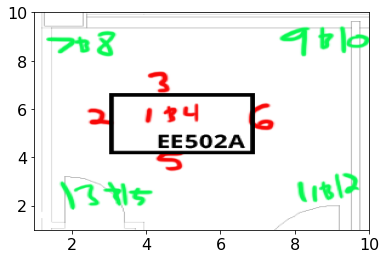

In [9]:
img = mpimg.imread("./Graphs, Images, and Animations/ICU1.png")
imgplot = plt.imshow(img, aspect='auto', extent=(1,10,1,10), alpha=1, zorder=-1)

### Check the Spatial Zoning distribution

In [10]:
if re.match('EE502',key):
    print('match')
else:
    print('no match')

no match


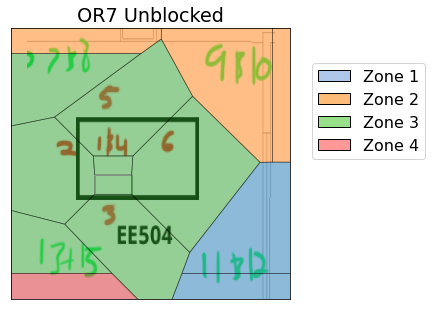

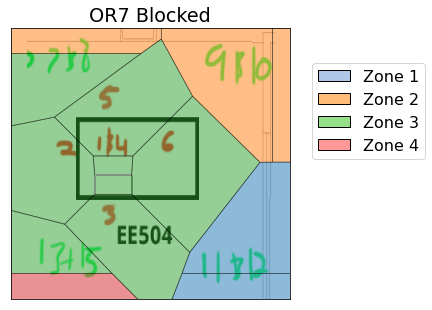

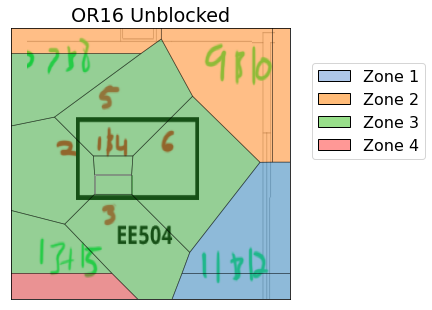

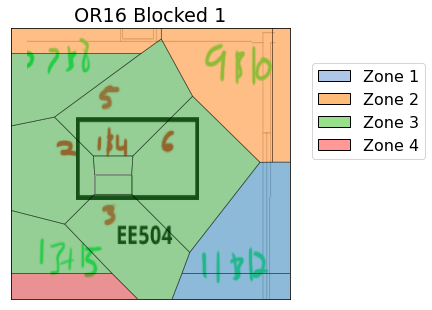

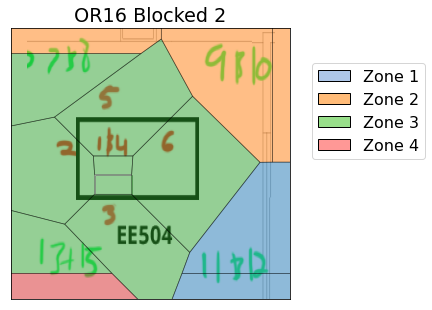

In [11]:
# ZoneAssignments.keys()
ISC = InteriorSensors
# fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(10,10))
for iteration,key in enumerate(ZoneAssignments.keys()):
    x=[]
    y=[]
    points = []
    for idx,sensor in enumerate(InteriorSensors):
        points.append(ISC[sensor])
    vor = Voronoi(points)
    regions, vertices = voronoi_finite_polygons_2d(vor)
    polygons = []
    for reg in regions:
        polygon = vertices[reg]
        polygons.append(polygon)

    plt.figure(figsize=(5,5))
    if re.match('EE502',key):
        route = './Graphs, Images, and Animations/ICU1.png'
    else:
        route = './Graphs, Images, and Animations/ICU2.png'
    img = mpimg.imread(route)
    plt.imshow(img, aspect='auto', extent=(0,10,0,11), alpha=1, zorder=-1)
    ax = plt.subplot(111)

    # Remove ticks
    ax.set_xticks([])
    ax.set_yticks([])

    ax.axis("equal")

    # Set limits
    ax.set_xlim(0,10)
    ax.set_ylim(0,11)

    # Add polygons 
    for idx,poly in enumerate(polygons):
        colored_cell = Polygon(poly,linewidth=0.7, alpha=0.5,facecolor=color[ZoneAssignments[key][idx]*2],edgecolor="black")
        ax.add_patch(colored_cell)
    plt.title(key)
    # got lazy here and explicitly defined the zones
    legend_elements = [Patch(facecolor=color[1], edgecolor='black',label='Zone 1'),
                       Patch(facecolor=color[3], edgecolor='black',label='Zone 2'),
                       Patch(facecolor=color[5], edgecolor='black',label='Zone 3'),
                       Patch(facecolor=color[7], edgecolor='black',label='Zone 4'),]
    plt.legend(handles = legend_elements,bbox_to_anchor=(1.05, .9))
    plt.show()
    # voronoi_plot_2d(vor)
        # sPlt[iteration%2][0 if iteration < 2 else 1].plot(X,Y,'o',color = C,mew = 10)


    


In [12]:
mergedData

,Date_Time,S-01,S-03,S-04,S-05,S-06,S-07,S-08,S-09,S-11,S-12,S-13,S-14,S-15,S-BU1,Average,Variance
0,2020-12-22 12:49:00,0.0,0.0,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,0.0,21.0,0.0,78.0,3.692308,51.443787
1,2020-12-22 12:49:01,0.0,0.9,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,0.9,18.9,0.0,78.0,3.669231,49.462722
2,2020-12-22 12:49:02,0.0,1.8,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,1.8,16.8,0.0,78.0,3.646154,47.481657
3,2020-12-22 12:49:03,0.0,2.7,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,2.7,14.7,0.0,78.0,3.623077,45.500592
4,2020-12-22 12:49:04,0.0,3.6,0.0,0.0,18.0,0.0,0.0,9.0,0.0,0.0,3.6,12.6,0.0,78.0,3.600000,43.519527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11976,2020-12-22 16:08:36,40.8,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,13.2,2730.0,5.4,9.0,7.8,215.953846,558622.885207
11977,2020-12-22 16:08:37,42.6,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,9.9,2866.5,6.3,9.0,9.1,226.407692,608792.900592
11978,2020-12-22 16:08:38,44.4,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,6.6,3003.0,7.2,9.0,10.4,236.861538,658962.915976
11979,2020-12-22 16:08:39,46.2,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,3.3,3139.5,8.1,9.0,11.7,247.315385,709132.931361


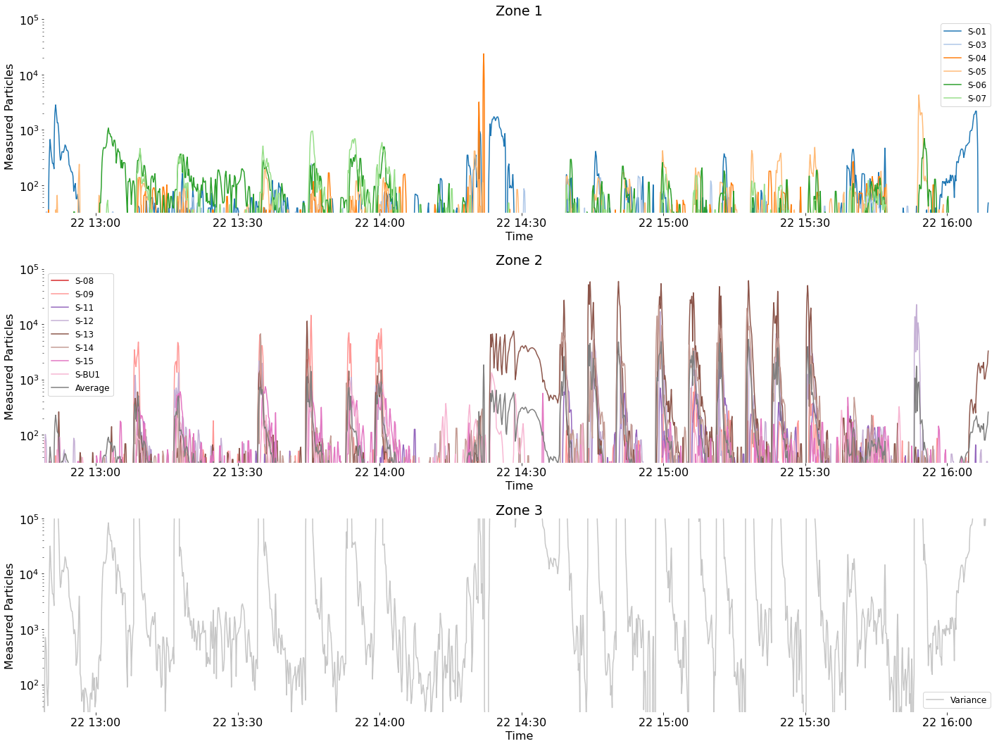

In [13]:

fig,sPlt=plt.subplots(3,sharex=False,sharey=False,figsize=(20,15))
# fig.delaxes(sPlt[1,1])
DataFrame = mergedData

for idx,sensor in enumerate(DataFrame.columns[1:19]):
    # if sensor in ['S-02','S-03','S-05']:
    #     continue
    if idx < 6:
        num = 0
    elif idx < 15:
        num = 1
    else:
        num = 2

    yData = DataFrame[sensor]
    xData = DataFrame["Date_Time"]

    sPlt[num].plot(xData,yData,color = color[idx],label = sensor)

for i in range(3):

    sPlt[i].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[i].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sensor = ['Zone 1','Zone 2','Zone 3']
    sPlt[i].set(title=sensor[i],xlabel='Time',ylabel='Measured Particles')
    
    # yData = DataFrame[DataFrame.keys()[21+i*2]]
    # xData = DataFrame["Date_Time"]
    # sPlt[i].plot(xData,yData,color = "Black",label = "Average",linewidth=2)
    # sPlt[i].grid(color='black', linestyle='--', linewidth=.1)



for ax in sPlt:
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False) 
    ax.legend(prop={'size':12})
    # ax.legend(loc="upper right")
    ax.set_ylim([10**1.5,10**5])
    ax.set_xlim([pd.Timestamp('12/22/2020 12:49:00'),pd.Timestamp('12/22/2020 16:10:00')])
    ax.set_yscale("log")

    
    
plt.tight_layout()
plt.rcParams.update({'font.size':16})


## Plots of Avg Zone reading with Avg sensor reading

In [14]:
trails = list(stExpDf.keys())
expirements = list(stAvgDf.keys())
[i for i in trails if expirements[0] in i]



['OR16 Blocked 1 Exp 1', 'OR16 Blocked 1 Exp 2', 'OR16 Blocked 1 Exp 3']

In [15]:
import pickle
with open('12_21_Data.pickle', 'wb') as handle:
    pickle.dump(stAvgDf, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Quad Plot

In [16]:
trails[0:9]

['OR16 Blocked 1 Exp 1',
 'OR16 Blocked 1 Exp 2',
 'OR16 Blocked 1 Exp 3',
 'OR16 Blocked 2 Exp 1',
 'OR16 Blocked 2 Exp 2',
 'OR16 Blocked 2 Exp 3',
 'OR16 Unblocked Exp 1',
 'OR16 Unblocked Exp 2',
 'OR16 Unblocked Exp 3']

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


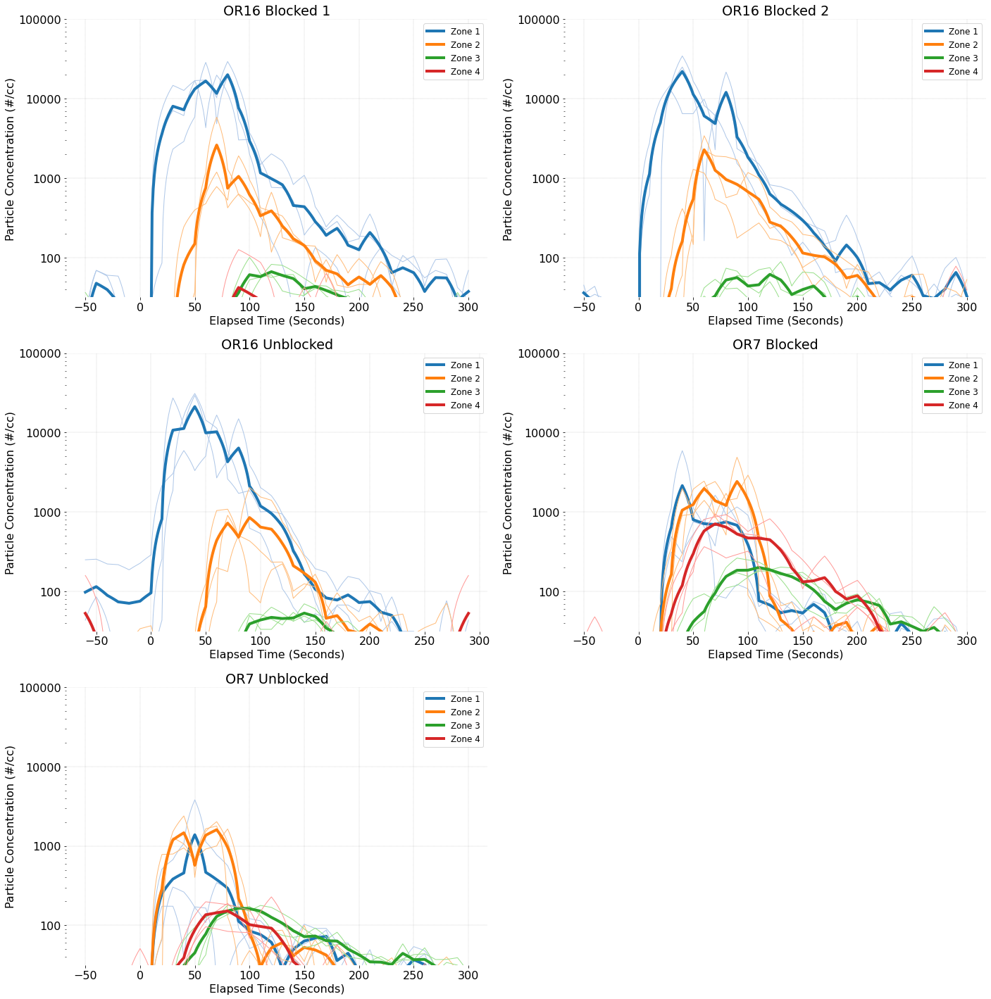

In [17]:

size = len(stAvgDf)
fig,sPlt=plt.subplots(3,2,sharex=False,sharey=False,figsize=(20,20))
#fig.suptitle("March 22nd Data",fontsize=30)
numZones = len(set(ZoneAssignments.iloc[:,1]))

zones = ['Zone '+str(i+1) for i in range(numZones)]
trails = list(stExpDf.keys())
zoneFrame = {}
for iteration,key in enumerate(stAvgDf):
    # fig.delaxes(sPlt[1,1])
    index = [0 if iteration < 2 else 1 if iteration < 4 else 2][0]

    DataFrame = stAvgDf[key]
    sensors = list(DataFrame.keys())[:(-2-numZones+1)]
    numExps = len([i for i,s in enumerate(stExpDf.keys()) if key in s])
    zoneFrame[key] = {}
    # creates a zoneFrame, which is a dictionary that will store of the sensor data for each zone for individual sensor plots
    for zone in range(numZones):
        zoneFrame[key][zone] = pd.DataFrame()

    for idx,zone in enumerate(ZoneAssignments[key]):
        for i in range(numExps):
            # print(idx)
            yData = stExpDf[key + ' Exp '+str(i+1)][sensors[idx]]
            zoneFrame[key][zone][sensors[idx] + ' Exp ' + str(i)] = yData


    for idx in range(numZones):
        # sPlt[i].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
        # sPlt[i].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 

        for trail in [i for i in trails if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print(trail,idx)
            yExpData = stExpDf[trail][zones[idx]]
            xExpData = np.array([i for i in range(-60,len(yData)-60)])+[10 if key!="OR16 Unblocked" else 0][0]
            sPlt[index][iteration%2].plot(xExpData,yExpData,color = color[idx*2+1],linewidth=1)
            # break
            

        yData = DataFrame[zones[idx]]
        yError = np.var(zoneFrame[key][idx],axis = 1)**.5
        xData = np.array([i for i in range(-60,len(yData)-60)])+[10 if key!="OR16 Unblocked" else 0][0]

        # sPlt[iteration].errorbar(xData,yData,yerr=yError,ecolor = color[idx*2+1],color = color[idx*2],label = zones[idx],linewidth=4)

        sPlt[index][iteration%2].plot(xData,yData,color = color[idx*2],label = zones[idx],linewidth=4)

    sPlt[index][iteration%2].grid(color='black', linestyle='--', linewidth=.1)
    sPlt[index][iteration%2].set(title=key,xlabel='Elapsed Time (Seconds)',ylabel='Particle Concentration (#/cc)')

    for el in sPlt:
        for ax in el:
            ax.spines["top"].set_visible(False)   
            ax.spines["bottom"].set_visible(False)    
            ax.spines["right"].set_visible(False)    
            ax.spines["left"].set_visible(False) 
            ax.legend(prop={'size':12})
            # ax.legend(loc="upper right")
            ax.set_ylim([10**1.5,10**5])
            # ax.set_xlim([pd.Timestamp(startTime),pd.Timestamp(endTime)])
            ax.set_yscale("log")
            ax.yaxis.set_major_formatter(ScalarFormatter())
    # break
        
        
plt.tight_layout()
plt.rcParams.update({'font.size':16})
fig.delaxes(sPlt[2][1])
# plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\Quad_12-21.png")
    # break
# mpld3.save_html(fig,'ZonedVariances.html')



## Solo Plots

In [18]:
stExpDf['OR16 Blocked 1' + ' Exp 1']['Zone 4']

0      0.0
1      0.4
2      0.8
3      1.2
4      1.6
      ... 
346    0.0
347    0.0
348    0.0
349    0.0
350    0.0
Name: Zone 4, Length: 351, dtype: float64

351
351
351
351
351


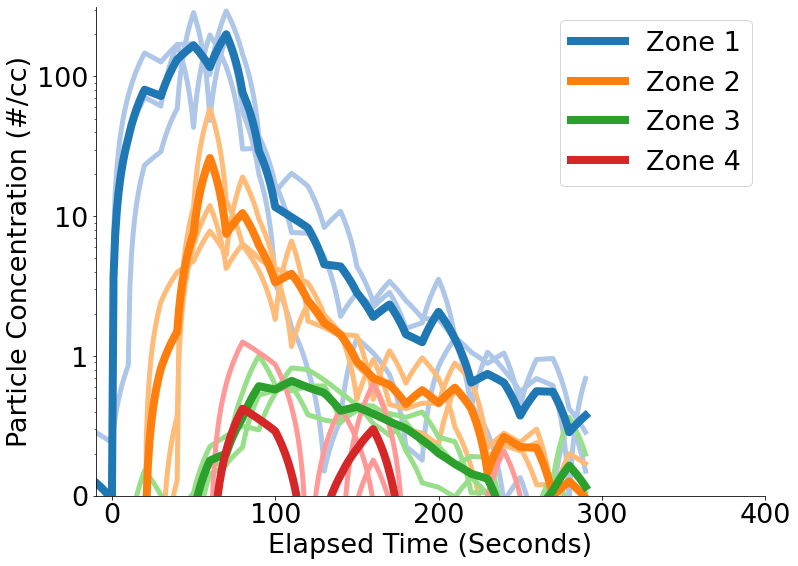

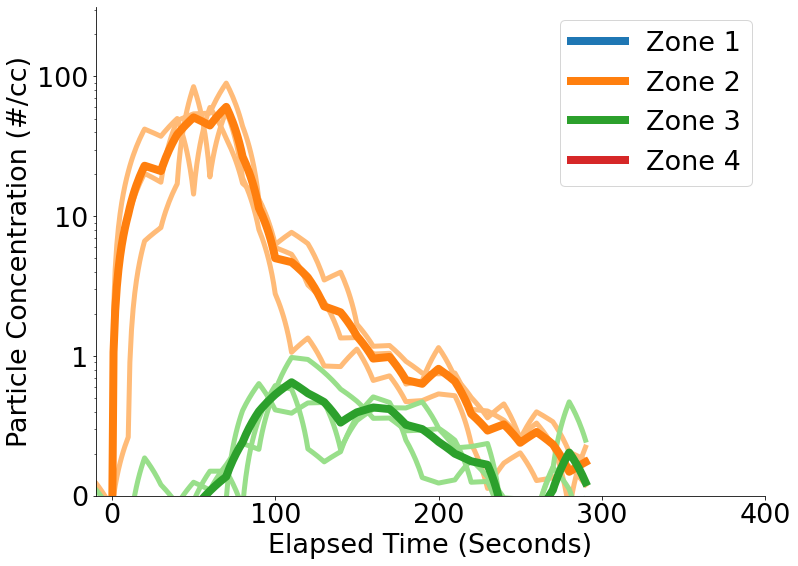

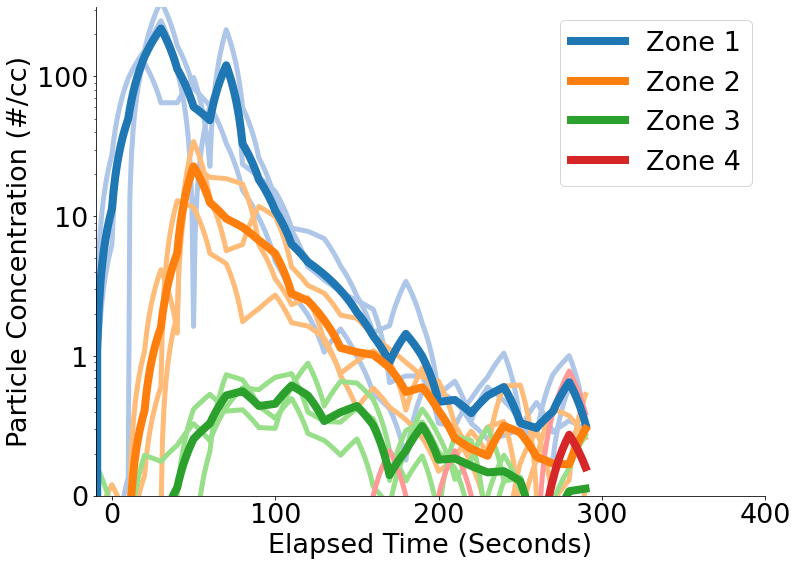

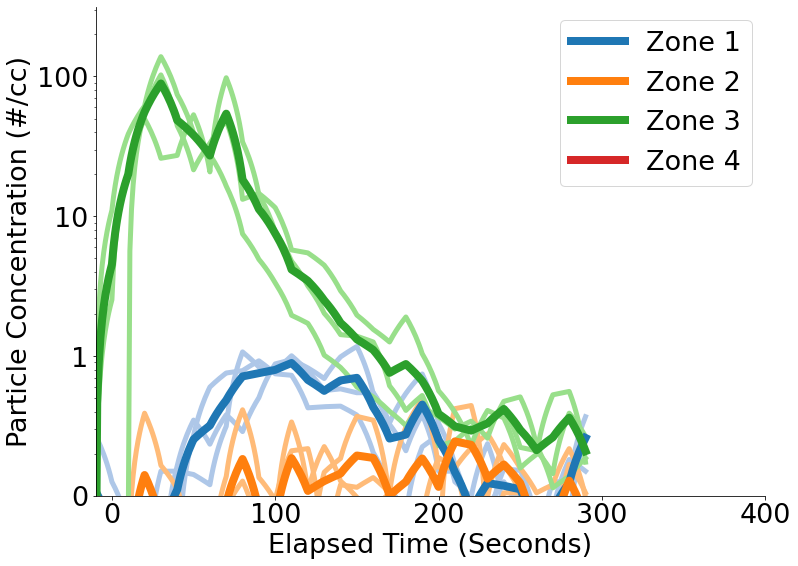

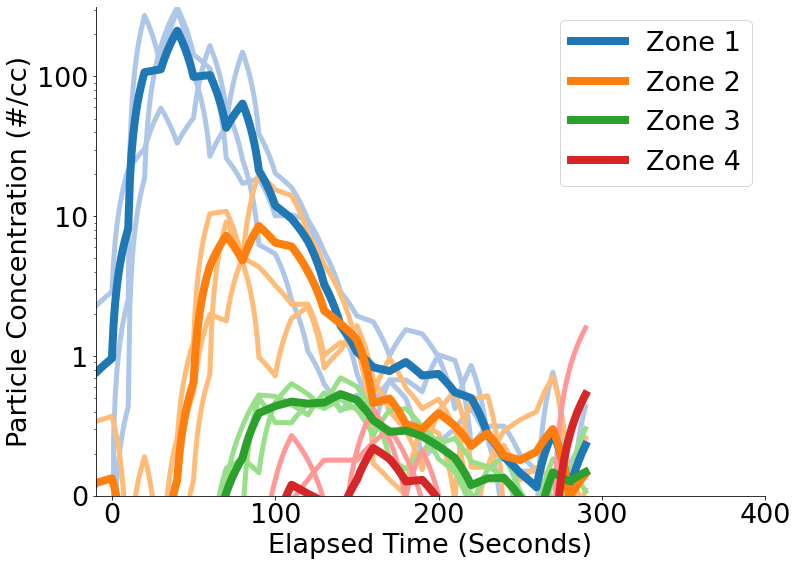

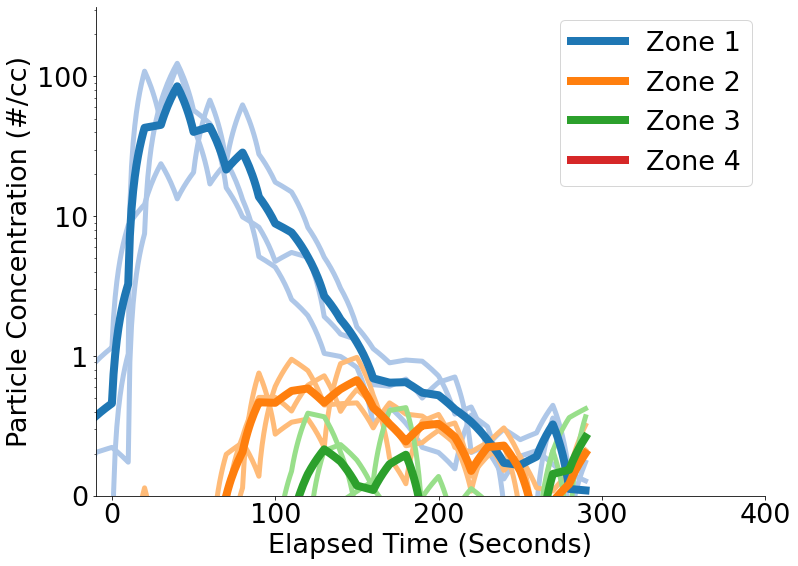

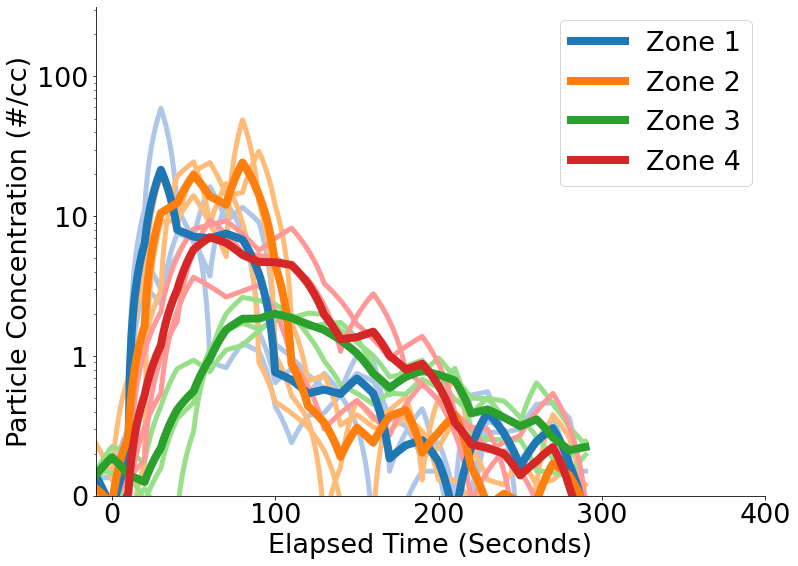

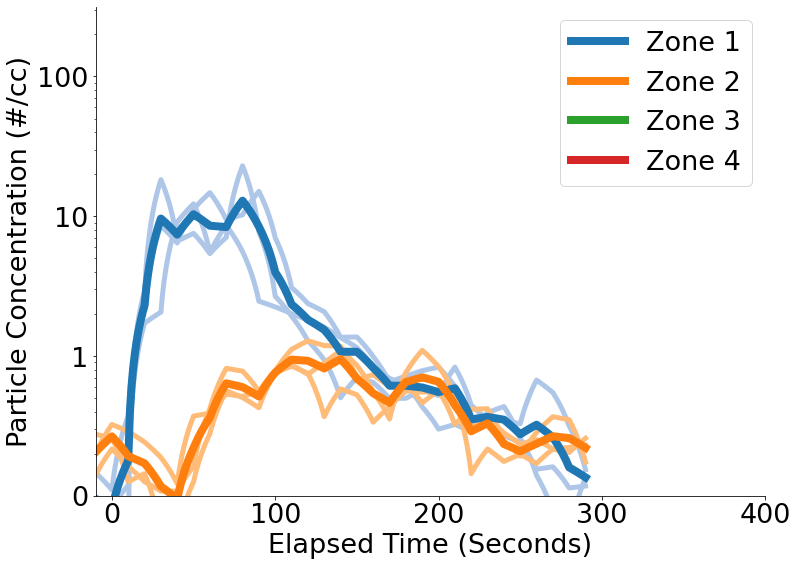

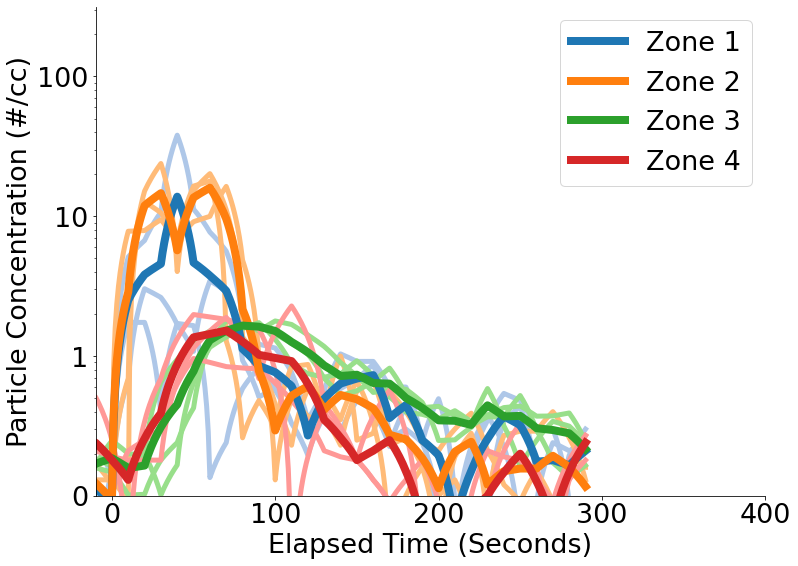

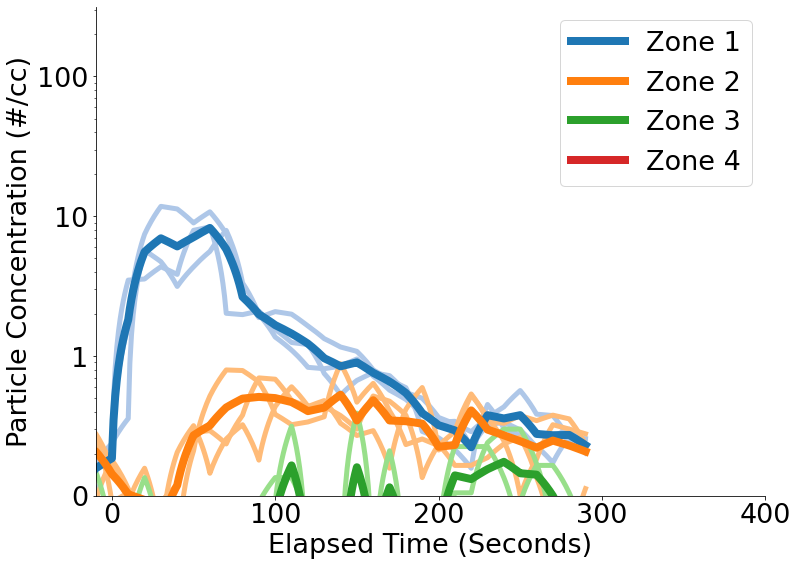

In [33]:
for nameNum in range(len(stAvgDf.keys())):

    #Just going to plot OR 
    names = list(stAvgDf.keys())
    fig = plt.figure(figsize=(12,9))
    ax = fig.gca()
    name = names[nameNum]
    key = name.split(" Exp ")[0]



    # dFrame = stExpDf[name]
    dFrame = stAvgDf[key]

    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        for trail in [i for i in trails if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print([200 if trail =="OR 12 Unblocked Exp 3" else 0][0])
            try:
                yExpData = stExpDf[trail]['Zone '+str(zone+1)]/100
                xExpData = np.array([i for i in range(-60,len(yData)-60)])#+[30 if trail =="OR 12 Blocked Exp 3" else 0][0]
                plt.plot(xExpData,yExpData,color = color[zone*2+1],linewidth=5)
            except:
                print(trail,'Zone '+str(zone+1),"data not available")
                continue
    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        plt.plot(xData,yData,color = color[zone*2],label = 'Zone '+str(zone+1),linewidth=8)
    plt.rcParams.update({'font.size':18})
    # plt.plot([5]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75,label = 'Snapshot')
    # plt.plot([30]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    # plt.plot([300]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    plt.legend()
    ax.set(xlabel='Elapsed Time (Seconds)',ylabel='Particle Concentration (#/cc)')
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(True)
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(True) 
    ax.legend(prop={'size':27})
    # ax.legend(loc="upper right")
    ax.set_ylim([10**-1,10**2.5])
    ax.set_xlim([-10,round(len(xData)/100)*100])
    print(len(xData))
    ax.set_yscale("log")
    ax.yaxis.set_major_formatter(ScalarFormatter())
    plt.rcParams.update({'font.size':27})

    # plt.savefig(f"C:\\Users\\RobertRochlin\\Documents\\UW\\covidDataProject\\finalImages\\totalORs\\Manual\\{key.replace(' ','_')}.jpg")

    #Just going to plot OR 

    ### AUTO PLOTS 
    names = list(stAvgDf.keys())

    fig = plt.figure(figsize=(12,9))
    ax = fig.gca()
    name = names[nameNum]
    key = name.split(" Exp ")[0]
    trials = list(stExpDfAuto.keys())


    # dFrame = stExpDf[name]
    dFrame = stAvgDfAuto[key]
    expDFrame = stExpDfAuto

    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        for trial in [i for i in trials if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print([200 if trial =="OR 12 Unblocked Exp 3" else 0][0])
            yExpData = expDFrame[trial]['Zone '+str(zone+1)]/100
            xExpData = np.array([i for i in range(-60,len(yData)-60)])#+[30 if trial =="OR 12 Blocked Exp 3" else 0][0]
            plt.plot(xExpData,yExpData,color = color[zone*2+1],linewidth=5)
    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        plt.plot(xData,yData,color = color[zone*2],label = 'Zone '+str(zone+1),linewidth=8)

    plt.rcParams.update({'font.size':18})
    # plt.plot([5]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75,label = 'Snapshot')
    # plt.plot([30]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    # plt.plot([300]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    plt.legend()
    ax.set(xlabel='Elapsed Time (Seconds)',ylabel='Particle Concentration (#/cc)')
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(True)
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(True) 
    ax.legend(prop={'size':27})
    # ax.legend(loc="upper right")
    ax.set_ylim([10**-1,10**2.5])
    ax.set_xlim([-10,round(len(xData)/100)*100])
    ax.set_yscale("log")
    ax.yaxis.set_major_formatter(ScalarFormatter())
    plt.rcParams.update({'font.size':27})

    # plt.savefig(f"C:\\Users\\RobertRochlin\\Documents\\UW\\covidDataProject\\finalImages\\totalORs\\Auto\\Auto{key.replace(' ','_')}.jpg")



In [20]:
zoneTracker={}
for key in ZoneAssignments:
    for idx,zone in enumerate(ZoneAssignments[key]):
        print(sensors[idx],zone)

S-01 2
S-03 2
S-04 2
S-05 2
S-06 2
S-07 2
S-08 2
S-09 1
S-11 1
S-12 1
S-13 0
S-14 0
S-15 2
S-BU1 3
S-01 2
S-03 2
S-04 2
S-05 2
S-06 2
S-07 2
S-08 2
S-09 1
S-11 1
S-12 1
S-13 0
S-14 0
S-15 2
S-BU1 3
S-01 2
S-03 2
S-04 2
S-05 2
S-06 2
S-07 2
S-08 2
S-09 1
S-11 1
S-12 1
S-13 0
S-14 0
S-15 2
S-BU1 3
S-01 2
S-03 2
S-04 2
S-05 2
S-06 2
S-07 2
S-08 2
S-09 1
S-11 1
S-12 1
S-13 0
S-14 0
S-15 2
S-BU1 3
S-01 2
S-03 2
S-04 2
S-05 2
S-06 2
S-07 2
S-08 2
S-09 1
S-11 1
S-12 1
S-13 0
S-14 0
S-15 2
S-BU1 3


<AxesSubplot:>

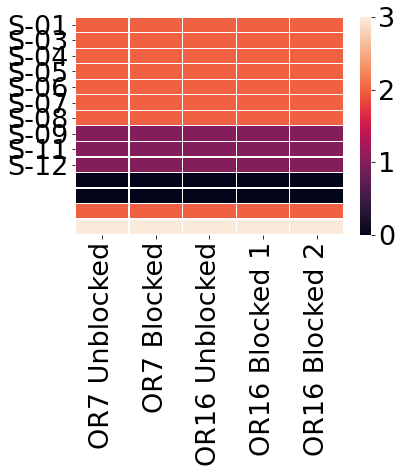

In [21]:
sns.heatmap(ZoneAssignments,yticklabels = sensors[:-5],label='x-small',linecolor='white',linewidths=.25)

In [22]:
indexList = {}
thresh = 2
offset = 60
for notUse,x in enumerate(stAvgDf):
    switch = 0
    for idx,i in enumerate(np.log(stAvgDf[x]['Average'])/np.log(10)):

        if (i >= thresh):
            switch = 1

        if switch and i <= thresh:
            indexList[x] = idx-offset
            switch = 0
            break

    if switch:
        indexList[x] = idx
    print(indexList[x],'seconds',x)

148 seconds OR16 Blocked 1
139 seconds OR16 Blocked 2
140 seconds OR16 Unblocked
136 seconds OR7 Blocked
110 seconds OR7 Unblocked


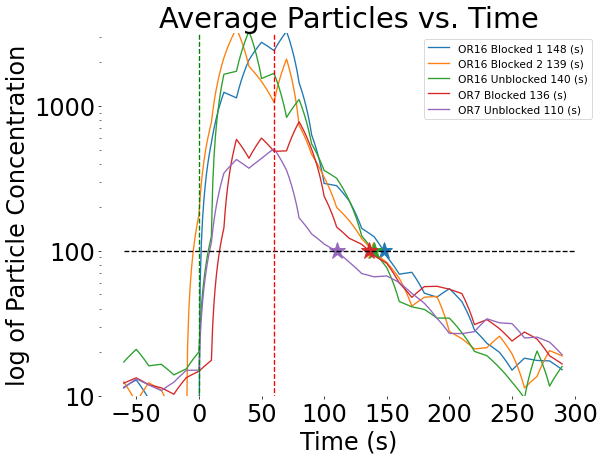

In [23]:
OR = ""#"OR7"
for idx,x in enumerate(stAvgDf):
    if not re.match(OR,x):
        continue
    fig = plt.figure(0, figsize=(10,7.5), dpi=64)
    ax = fig.gca()
    yData = stAvgDf[x]['Average']
    xData = indexList[x]

    ax.plot([i for i in range(-60,len(yData)-60)],yData,color = color[idx*2],label = x + ' ' + str(xData) + ' (s)')

    ax.plot([xData],[10**thresh],'*',ms=20,color = color[idx*2])
    # ax.plot([xData,cData],[0,5])

    # ax.plot([i for i in range(-60,len(yData)-60)],yData,'.')
    # ax.plot([xData,xData],[0,200])

# ax.plot([-60,len(yData)-60],[thresh**3,thresh**3],color = 'white')

## plotting lines here
ax.plot([-60,300],[10**thresh]*2,'--',color = 'black')
ax.plot([0,0],[10**4,1],'--',color = 'green')
ax.plot([60,60],[10**4,1],'--',color = 'red')

plt.yscale("log")

plt.ylim([10,10**3.5])

# ax.plot([150,150],[0,1000])

ax.legend()
ax.set_xlabel('Time (s)')
ax.set_ylabel('log of Particle Concentration')
plt.title('Average Particles vs. Time')
ax.spines["top"].set_visible(False)   
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 
ax.legend(prop={'size':12})
ax.yaxis.set_major_formatter(ScalarFormatter())
plt.rcParams.update({'font.size':15})
ax.fill_between([0,60], [1,3], [1,3],facecolor='green',where=True, alpha=0.5)
plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\AvgVsTime\Avg_12-21_"+OR+".png")
# #For exporting
# mpld3.save_html(fig,'avgParticlePlot27_Thresh.html')

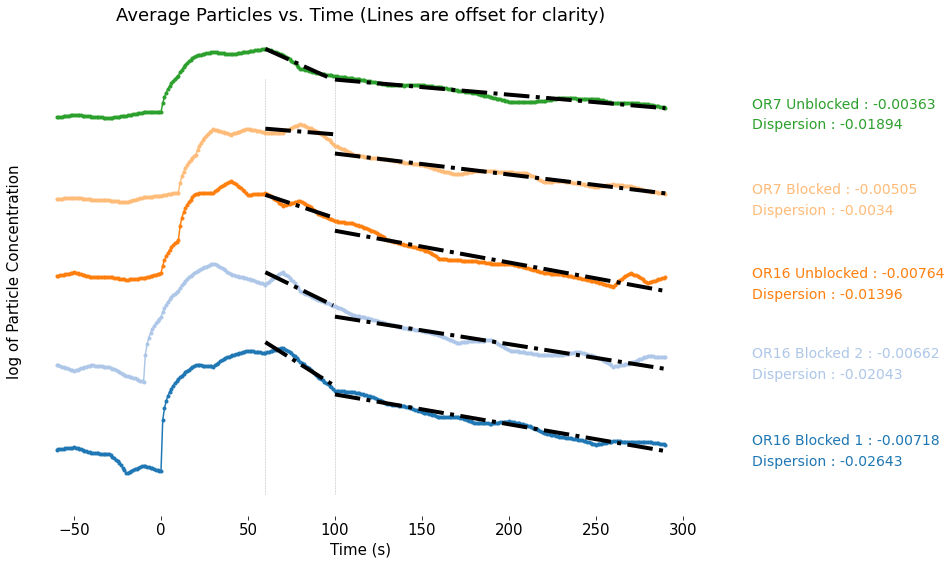

In [24]:
fig = plt.figure(0,figsize=(12,9))
ax = plt.subplot(111)   
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().set_ticks([]) 
ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 
ax.set_xlabel('Time (s)')
ax.set_ylabel('log of Particle Concentration')
plt.title('Average Particles vs. Time (Lines are offset for clarity)')
plt.plot([60,60], [0,10], "--", lw=0.5, color="black", alpha=0.3)
plt.plot([100,100], [0,10], "--", lw=0.5, color="black", alpha=0.3)   
spaceFactor = 2

for idx,x in enumerate(stAvgDf):

    yData = stAvgDf[x]['Average']
    xData = indexList[x]

    yPoints = np.log10(stAvgDf[x]['Average'][160:])
    xPoints = np.array([i+100 for i in range(len(yPoints))])
    m,b = np.polyfit(xPoints,yPoints,1)

    yPoints2 = np.log10(stAvgDf[x]['Average'][120:160])
    xPoints2 = np.array([i+60 for i in range(40)])
    m2,b2 = np.polyfit(xPoints2,yPoints2,1)
    
    ax.plot([i for i in range(-60,len(yData)-60)],np.log10(yData)+idx*spaceFactor,'.-',color = tableau20[idx],label = x + ': Coefficient  ' + str(round(m,3)) )

    ax.plot(xPoints,m*xPoints+b+idx*spaceFactor,'-.',color = 'black',linewidth=4)
    ax.plot(xPoints2,m2*xPoints2+b2+idx*spaceFactor,'-.',color = 'black',linewidth=4)
    y_pos = yPoints.values[-1] + idx*spaceFactor
    plt.text(240+100, y_pos, x + ' : '+str(round(m,5)), fontsize=14, color=tableau20[idx])
    plt.text(240+100, y_pos-.50, 'Dispersion' + ' : '+str(round(m2,5)), fontsize=14, color=tableau20[idx])

# # #For Exporting
plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\AvgPvT12_21.svg")


In [25]:
np.log(10)

2.302585092994046

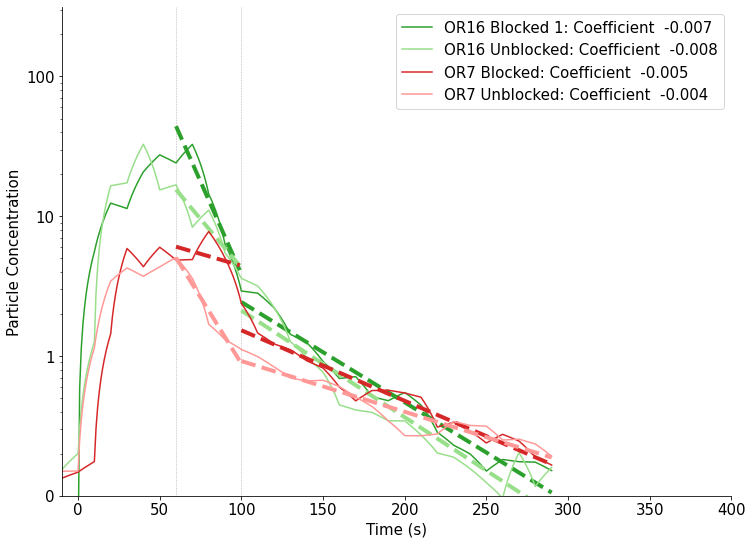

In [26]:
fig = plt.figure(0,figsize=(12,9))
ax = plt.subplot(111)   
ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().set_ticks([]) 
ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(True)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(True) 
ax.set_xlabel('Time (s)')
ax.set_ylabel('Particle Concentration')

# plt.title('Average Particles vs. Time (Lines are offset for clarity)')
plt.plot([60,60], [0,10**3], "--", lw=0.5, color="black", alpha=0.3)
plt.plot([100,100], [0,10**3], "--", lw=0.5, color="black", alpha=0.3)
plt.yscale("log")
spaceFactor = 1
counter = 0
for idx,x in enumerate(stAvgDf):

    if re.match("OR16 Blocked 2",x):
        continue
    idx = counter

    yData = stAvgDf[x]['Average']
    xData = indexList[x]

    yPoints = np.log10(stAvgDf[x]['Average'][160:])
    xPoints = np.array([i+100 for i in range(len(yPoints))])
    m,b = np.polyfit(xPoints,yPoints,1)

    yPoints2 = np.log10(stAvgDf[x]['Average'][120:160])
    xPoints2 = np.array([i+60 for i in range(40)])
    m2,b2 = np.polyfit(xPoints2,yPoints2,1)
    
    ax.plot([i for i in range(-60,len(yData)-60)],yData/100+idx*spaceFactor*0,'-',color = tableau20[idx+4],label = x + ': Coefficient  ' + str(round(m,3)) )

    ax.plot(xPoints,10**(m*xPoints+b)/100,'--',color = tableau20[idx+4],linewidth=4)
    ax.plot(xPoints2,10**(m2*xPoints2+b2)/100,'--',color = tableau20[idx+4],linewidth=4)
    y_pos = yPoints.values[-1] + idx*spaceFactor
    # plt.text(240+250, y_pos, x + ' : '+str(round(m,5)), fontsize=14, color=tableau20[idx*2])
    # plt.text(240+250, y_pos-.50, 'Dispersion' + ' : '+str(round(m2,5)), fontsize=14, color=tableau20[idx*2])
    counter = counter + 1
ax.legend()
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.set_ylim([10**-1,10**2.5])
ax.set_xlim([-10,400])
plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\DecaysDiffColor12_21.jpg")

### Plotting Data for Sensors

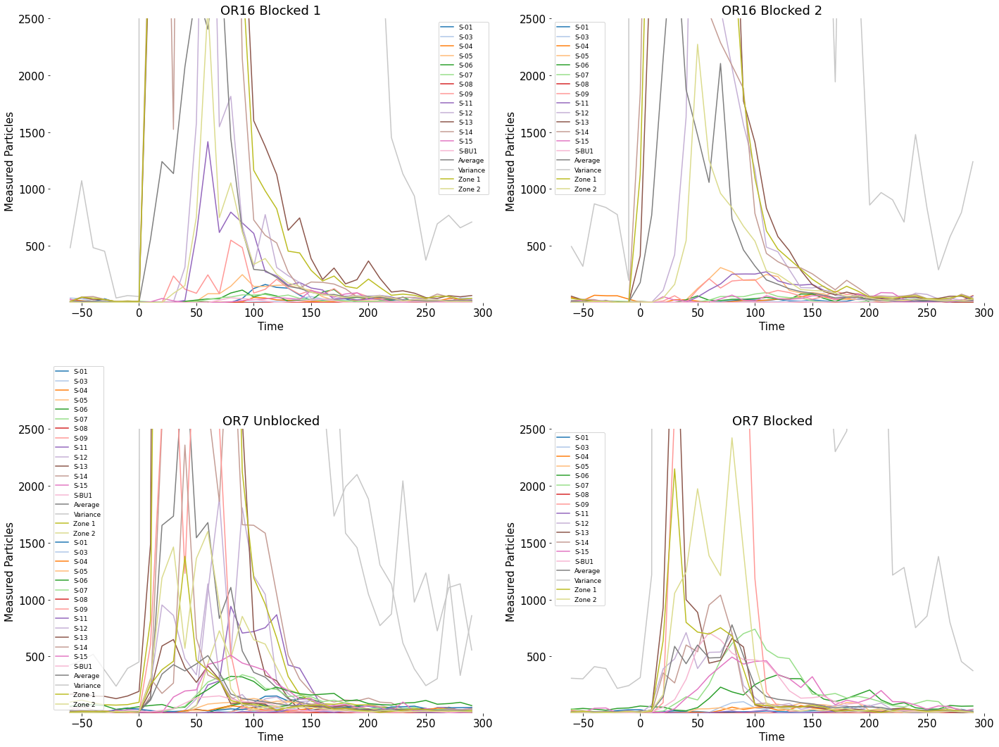

In [27]:

fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(20,15))
# fig.delaxes(sPlt[1,1])
DataFrame = stAvgDf
for idx,x in enumerate(DataFrame):
    for loop,zone in enumerate(DataFrame[x].columns[:18]):
        # if zone == 'S-13':
        #     continue
        yData = (DataFrame[x][zone])
        xData = [i for i in range(-60,len(yData)-60)]

        sPlt[1 if idx > 1 else 0][idx%2].plot(xData,yData,color = color[loop],label = zone)

    sPlt[1 if idx > 1 else 0][idx%2].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[1 if idx > 1 else 0][idx%2].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sPlt[1 if idx > 1 else 0][idx%2].set(title=x,xlabel='Time',ylabel='Measured Particles')


for el in sPlt:
    for ax in el:
        ax.spines["top"].set_visible(False)   
        ax.spines["bottom"].set_visible(False)    
        ax.spines["right"].set_visible(False)    
        ax.spines["left"].set_visible(False) 
        ax.legend(prop={'size':9})
        ax.set_ylim([1,2500])


plt.tight_layout()
plt.rcParams.update({'font.size':22})


### Plotting Data for Zones

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


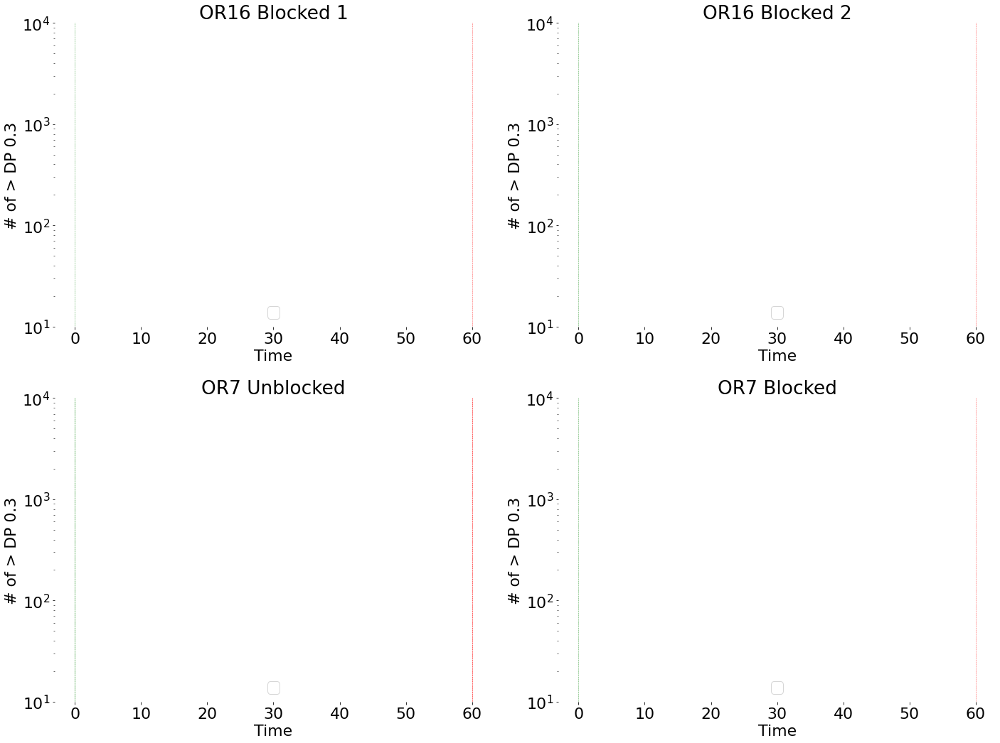

In [28]:

fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(20,15))

DataFrame = stAvgDf
for idx,x in enumerate(DataFrame):
    for loop,zone in enumerate(DataFrame[x].columns[20:]):
        # if True: 

        if re.match(r"Zone",zone):

            yData = (DataFrame[x][zone])
            xData = [i for i in range(-60,len(yData)-60)]

            sPlt[1 if idx > 1 else 0][idx%2].plot(xData,yData,color = color[loop],label = zone)
            
    sPlt[1 if idx > 1 else 0][idx%2].plot([60,60], [1,10**4.5], "--", lw=0.5, color="red", alpha=0.75)
    sPlt[1 if idx > 1 else 0][idx%2].plot([0,0], [1,10**4.5], "--", lw=0.5, color="green", alpha=0.75) 
    sPlt[1 if idx > 1 else 0][idx%2].set(title=x,xlabel='Time',ylabel='# of > DP 0.3')


for el in sPlt:
    for ax in el:
        ax.spines["top"].set_visible(False)   
        ax.spines["bottom"].set_visible(False)    
        ax.spines["right"].set_visible(False)    
        ax.spines["left"].set_visible(False) 
        ax.legend()
        ax.set_yscale('log')
        ax.set_ylim([10,10**4])

# sPlt[0][1].set(title='OR7 Blocked',xlabel='Time',ylabel='Log of Particle concentration')
# sPlt[0][0].set(title='OR16 Blocked 1')
plt.tight_layout()
plt.rcParams.update({'font.size':16})





In [29]:
DataFrame[x].columns[18:]

Index(['Zone 3', 'Zone 4'], dtype='object')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


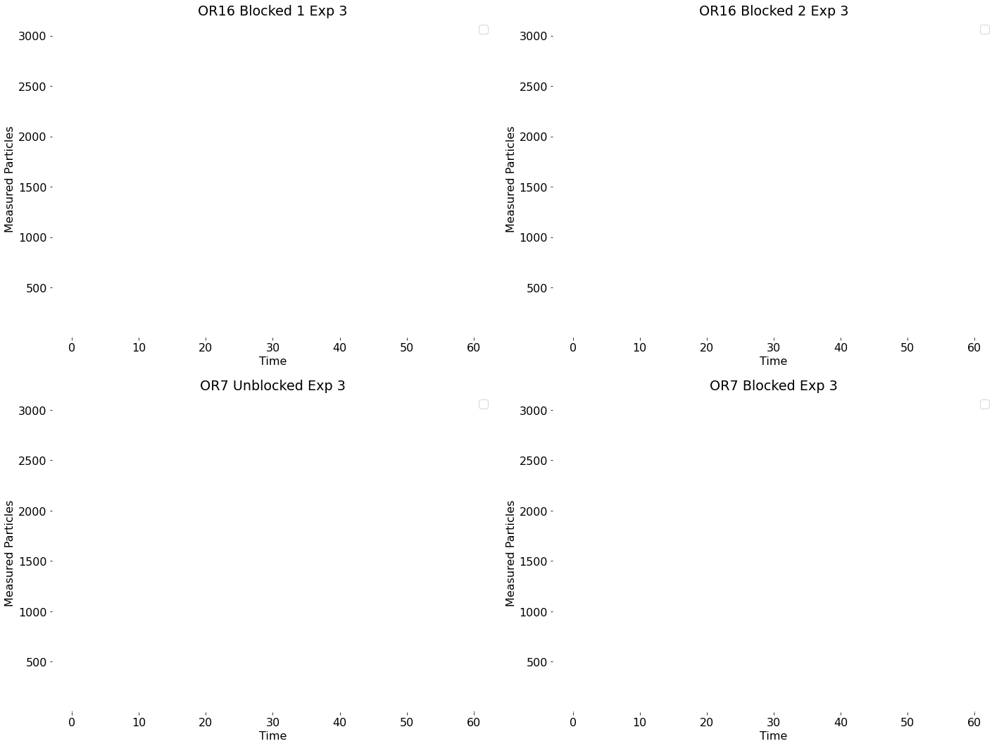

In [30]:

fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(20,15))

DataFrame = stExpDf
for idx,x in enumerate(DataFrame):
    index = math.floor(idx/3)
    yData = DataFrame[x]
    xData = [i for i in range(-60,len(yData)-60)]
    for loop,zone in enumerate(DataFrame[x].columns[20:]):
            if not loop%2:
                sPlt[1 if index > 1 else 0][index%2].plot(xData,yData[zone],color = color[loop],label = zone)

    sPlt[1 if index > 1 else 0][index%2].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[1 if index > 1 else 0][index%2].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sPlt[1 if index > 1 else 0][index%2].set(title=x,xlabel='Time',ylabel='Measured Particles')

for el in sPlt:
    for ax in el:
        ax.spines["top"].set_visible(False)   
        ax.spines["bottom"].set_visible(False)    
        ax.spines["right"].set_visible(False)    
        ax.spines["left"].set_visible(False) 
        ax.legend(loc="upper right")
        ax.set_ylim([1,10**3.5])
# sPlt[0][1].set(title='OR7 Blocked',xlabel='Time',ylabel='Log of Particle concentration')
# sPlt[0][0].set(title='OR16 Blocked 1')
plt.tight_layout()
plt.rcParams.update({'font.size':16})
